In [1]:
import pandas as pd

In [2]:
california = pd.read_csv("https://raw.githubusercontent.com/Statsomat/Datasets/master/data-ml/cal_housing/CaliforniaHousing/cal_housing.data")

In [3]:
california.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20639 entries, 0 to 20638
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   -122.230000    20639 non-null  float64
 1   37.880000      20639 non-null  float64
 2   41.000000      20639 non-null  float64
 3   880.000000     20639 non-null  float64
 4   129.000000     20639 non-null  float64
 5   322.000000     20639 non-null  float64
 6   126.000000     20639 non-null  float64
 7   8.325200       20639 non-null  float64
 8   452600.000000  20639 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


In [6]:
column_names = [
    'longitude',            # -124.35 to -114.31
    'latitude',             # 32.54 to 41.95
    'housing_median_age',   # 1 to 52
    'total_rooms',          # e.g. 2 to 39320
    'total_bedrooms',       # ...
    'population',           # ...
    'households',           # ...
    'median_income',        # ~0 to 15
    'median_house_value'    # ~14,999 to 500,001
]


In [7]:
len(column_names)

9

In [8]:
# Define column names to DF
california.columns = column_names

In [9]:
# Short EDA
print(california.describe())

          longitude      latitude  housing_median_age   total_rooms  \
count  20639.000000  20639.000000        20639.000000  20639.000000   
mean    -119.569576     35.631753           28.638888   2635.848152   
std        2.003495      2.135947           12.585568   2181.633870   
min     -124.350000     32.540000            1.000000      2.000000   
25%     -121.800000     33.930000           18.000000   1448.000000   
50%     -118.490000     34.260000           29.000000   2127.000000   
75%     -118.010000     37.710000           37.000000   3148.000000   
max     -114.310000     41.950000           52.000000  39320.000000   

       total_bedrooms    population    households  median_income  \
count    20639.000000  20639.000000  20639.000000   20639.000000   
mean       537.917825   1425.530210    499.557779       3.870455   
std        421.248495   1132.463507    382.330173       1.899615   
min          1.000000      3.000000      1.000000       0.499900   
25%        295.50000

In [10]:
pip install dtreeviz

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [11]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, r2_score
import dtreeviz

# Prepare for sklearn with Regression Tree
X = california.drop('median_house_value', axis=1)  # All columns except the target
y = california['median_house_value']  # Target variable


# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
column_names_x = list(X_train.columns)

In [12]:
import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

In [13]:
# Fit Regression Tree
# Here we fit two models with different maximum depths
regr_1 = DecisionTreeRegressor(max_depth=3, criterion="squared_error")
regr_1.fit(X_train, y_train)


# Vizualization with dtreeviz
viz_rmodel = dtreeviz.model(regr_1, X_train, y_train,
                            target_name='median_house_value',
                            feature_names = column_names_x,
                            class_names=None)  # for regression, set to None


c:\Users\behro\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


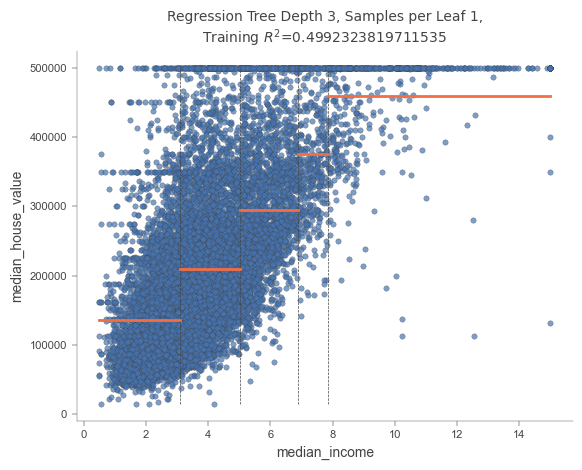

In [14]:
# Vizualize one feature
viz_rmodel.rtree_feature_space(features=['median_income'])

[Text(0.5, 0.875, 'median_income <= 5.035\nsquared_error = 13383171907.477\nsamples = 16511\nvalue = 207231.372'),
 Text(0.25, 0.625, 'median_income <= 3.074\nsquared_error = 8356353152.55\nsamples = 12999\nvalue = 173485.128'),
 Text(0.375, 0.75, 'True  '),
 Text(0.125, 0.375, 'latitude <= 34.455\nsquared_error = 5564113793.344\nsamples = 6283\nvalue = 135637.933'),
 Text(0.0625, 0.125, 'squared_error = 5486343050.51\nsamples = 3039\nvalue = 156767.99'),
 Text(0.1875, 0.125, 'squared_error = 4826872189.554\nsamples = 3244\nvalue = 115843.159'),
 Text(0.375, 0.375, 'housing_median_age <= 47.5\nsquared_error = 8374849114.206\nsamples = 6716\nvalue = 208892.204'),
 Text(0.3125, 0.125, 'squared_error = 7299975655.919\nsamples = 6144\nvalue = 201346.353'),
 Text(0.4375, 0.125, 'squared_error = 12739319450.647\nsamples = 572\nvalue = 289944.149'),
 Text(0.75, 0.625, 'median_income <= 6.887\nsquared_error = 12172565521.447\nsamples = 3512\nvalue = 332136.676'),
 Text(0.625, 0.75, '  False'),

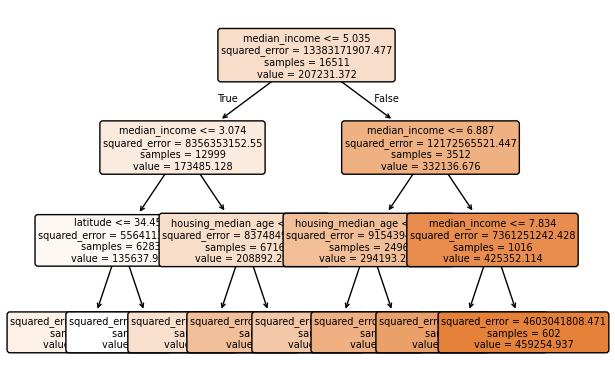

In [15]:
# Plot decision tree
plot_tree(regr_1, filled=True, feature_names=column_names_x, rounded=True, fontsize=7)

c:\Users\behro\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


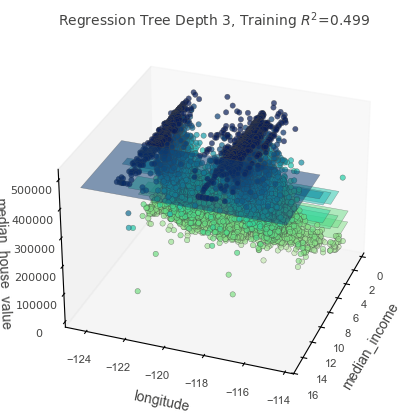

In [16]:
viz_rmodel.rtree_feature_space3D(features=['median_income','longitude'],
                                 fontsize=10,
                                 elev=30, azim=20,
                                 show={'splits', 'title'},
                                 colors={'tessellation_alpha': .5})

c:\Users\behro\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


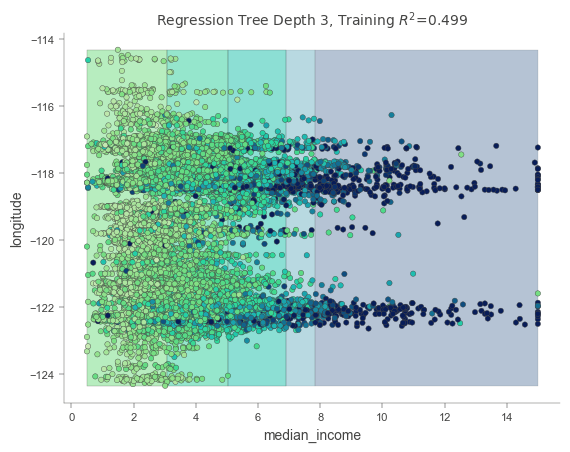

In [17]:
viz_rmodel.rtree_feature_space(features=['median_income','longitude'])

In [18]:
viz_rmodel.view(orientation="LR")

c:\Users\behro\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


In [19]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, explained_variance_score
import pandas as pd
import numpy as np

# Make predictions on both train and test sets
y_train_pred = regr_1.predict(X_train)
y_test_pred = regr_1.predict(X_test)

# Calculate residuals (errors)
train_residuals = y_train - y_train_pred
test_residuals = y_test - y_test_pred

# Extended metrics function with standard error
def calculate_metrics(y_true, y_pred):
    residuals = y_true - y_pred
    n = len(y_true)

    return {
        'MSE': mean_squared_error(y_true, y_pred),
        'RMSE': np.sqrt(mean_squared_error(y_true, y_pred)),
        'MAE': mean_absolute_error(y_true, y_pred),
        'R²': r2_score(y_true, y_pred),
        'Standard Error': np.std(residuals) / np.sqrt(n),  # Standard deviation of prediction
        'Sample Size': n
    }

# Calculate for both sets
train_metrics = calculate_metrics(y_train, y_train_pred)
test_metrics = calculate_metrics(y_test, y_test_pred)

# Create comprehensive table
detailed_table = pd.DataFrame({
    'Training': train_metrics,
    'Test': test_metrics
}).round(4)

print("Comprehensive Model Evaluation:")
print("=" * 45)
print(detailed_table)



Comprehensive Model Evaluation:
                    Training          Test
MSE             6.701859e+09  6.804552e+09
RMSE            8.186488e+04  8.248971e+04
MAE             6.126180e+04  6.144909e+04
R²              4.992000e-01  4.778000e-01
Standard Error  6.371049e+02  1.283652e+03
Sample Size     1.651100e+04  4.128000e+03
